## Extração de Features 

The 5 feature extractions involved are:
- **Mel-Frequency Cepstral Coefficients (MFCC):** the coefficients that collectively make up the short-term power spectrum of a sound.
-  **Mel-scaled power spectrogram:** the Mel Scale is used to provide greater resolution for more informative (lower) frequencies.
- **Chromagram of a short-time Fourier transform:** projects into bins representing the 12 distinct semitones (or chroma) of the musical octave.
- **Octave-based spectral contrast:** distributions of sound energy over octave frequencies
- **Tonnetz:** estimates tonal centroids as coordinates in a six-dimensional interval space.

In [1]:
from glob import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
import librosa.display
%matplotlib inline
plt.style.use('ggplot')

/opt/conda/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/opt/conda/lib/python3.7/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


In [2]:
sound_file_paths = ["aircon.wav", "carhorn.wav", "play.wav", "dogbark.wav", "drill.wav",
                   "engine.wav","gunshots.wav","jackhammer.wav","siren.wav","music.wav"]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

parent_dir = 'samples/'
raw_data_dir = '/notebooks/datasets/UrbanSound8K/audio/'      
data_dir = 'data_us8k_numpy'

In [3]:
def load_sound_files(parent_dir, file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(parent_dir + fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        D = librosa.amplitude_to_db(np.abs(librosa.stft(f))**2,ref=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

In [4]:
raw_sounds = load_sound_files(parent_dir, sound_file_paths)

In [5]:
plot_waves(sound_names, raw_sounds)
plot_specgram(sound_names, raw_sounds)
plot_log_power_specgram(sound_names, raw_sounds)

/opt/conda/lib/python3.7/site-packages/matplotlib/axes/_axes.py:7531: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


/opt/conda/lib/python3.7/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:862: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


In [6]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dirs):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        data_folder = os.path.join(parent_dir, sub_dir)
        for fn in glob(os.path.join(data_folder, '*.wav')):
            try:
                mfccs, chroma, mel, contrast, tonnetz = extract_feature(fn)
                ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
                features = np.vstack([features,ext_features])
                labels = np.append(labels, fn.split('fold')[1].split('-')[1])
            except:
                print("Error processing " + fn + " - skipping")
    return np.array(features), np.array(labels, dtype = np.int)

def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

In [7]:
sample_filename = "samples/siren.wav"
mfccs, chroma, mel, contrast, tonnetz = extract_feature(sample_filename)
all_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
print ("MFCSS  = ", len(mfccs))
print ("Chroma = ", len(chroma))
print ("Mel = ", len(mel))
print ("Contrast = ", len(contrast))
print ("Tonnetz = ", len(tonnetz))

data_points, _ = librosa.load(sample_filename)
print ("IN: Initial Data Points =", len(data_points), np.shape(data_points))
print ("OUT: Total features =", len(all_features), np.shape(all_features))

MFCSS  =  40
Chroma =  12
Mel =  128
Contrast =  7
Tonnetz =  6
IN: Initial Data Points = 88200 (88200,)
OUT: Total features = 193 (193,)


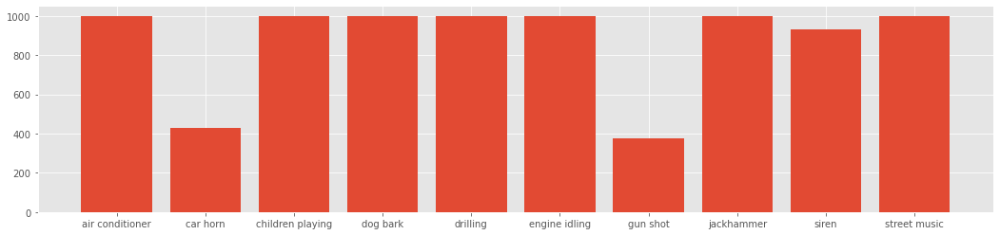

In [8]:
def get_labels(parent_dir,sub_dirs):
    labels = np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        data_folder = os.path.join(parent_dir, sub_dir)
        for fn in glob(os.path.join(data_folder, '*.wav')):
            try:
                class_value = fn.split('fold')[1].split('-')[1]
                labels = np.append(labels, class_value)
            except:
                print("Error processing " + fn + " - skipping")
    return labels


subsequent_fold = False
for k in range(1,11):
    fold_name = 'fold' + str(k)
    labels = get_labels(raw_data_dir, [fold_name])
    if subsequent_fold:
        all_labels = np.concatenate((all_labels, labels))
    else:
        all_labels = labels
        subsequent_fold = True
    
unique, counts = np.unique(all_labels, return_counts=True)

plt.figure(figsize=(18,4))
plt.bar(np.arange(len(unique)), counts, align='center')
plt.xticks(np.arange(len(unique)), sound_names)
plt.show()

In [9]:
# use this to process the audio files into numpy arrays
def save_folds():
    for k in range(1,11):
        fold_name = 'fold' + str(k)
        print ("\nSaving " + fold_name)
        features, labels = parse_audio_files(raw_data_dir, [fold_name])
        labels = one_hot_encode(labels)
        
        print ("Features of", fold_name , " = ", features.shape)
        print ("Labels of", fold_name , " = ", labels.shape)
        
        feature_file = os.path.join(data_dir, fold_name + '_x.npy')
        labels_file = os.path.join(data_dir, fold_name + '_y.npy')
        np.save(feature_file, features)
        print ("Saved " + feature_file)
        np.save(labels_file, labels)
        print ("Saved " + labels_file)
    
# uncomment this to recreate and save the feature vectors   

save_folds()



Saving fold1


/opt/conda/lib/python3.7/site-packages/librosa/core/pitch.py:146: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


Error processing /notebooks/datasets/UrbanSound8K/audio/fold1/87275-1-2-0.wav - skipping
Features of fold1  =  (872, 193)
Labels of fold1  =  (872, 10)
Saved data_us8k_numpy/fold1_x.npy
Saved data_us8k_numpy/fold1_y.npy

Saving fold2
Error processing /notebooks/datasets/UrbanSound8K/audio/fold2/17307-1-0-0.wav - skipping
Features of fold2  =  (887, 193)
Labels of fold2  =  (887, 10)
Saved data_us8k_numpy/fold2_x.npy
Saved data_us8k_numpy/fold2_y.npy

Saving fold3
Features of fold3  =  (925, 193)
Labels of fold3  =  (925, 10)
Saved data_us8k_numpy/fold3_x.npy
Saved data_us8k_numpy/fold3_y.npy

Saving fold4
Features of fold4  =  (990, 193)
Labels of fold4  =  (990, 10)
Saved data_us8k_numpy/fold4_x.npy
Saved data_us8k_numpy/fold4_y.npy

Saving fold5
Features of fold5  =  (936, 193)
Labels of fold5  =  (936, 10)
Saved data_us8k_numpy/fold5_x.npy
Saved data_us8k_numpy/fold5_y.npy

Saving fold6
Features of fold6  =  (823, 193)
Labels of fold6  =  (823, 10)
Saved data_us8k_numpy/fold6_x.npy


In [ ]:
## Concat all folders

for i in range(DATA.shape[0]):
    
    fullpath, class_id = path_class(DATA.slice_file_name[i])
    try:
        X, sample_rate = librosa.load(fullpath, res_type='kaiser_fast')
        mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
        stft = np.abs(librosa.stft(X))
        chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
        mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
        contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
        tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
        
    except Exception:
        print("Error encountered while parsing file")
        mfccs, chroma, mel, contrast, tonnetz, class_id = None, None, None, None, None, None
    mfccs = mfccs
    chroma = chroma
    mel = mel 
    contrast = contrast
    tonnetz = tonnetz
    label = class_id
    dataset[i,0],dataset[i,1], dataset[i,2], dataset[i,3], dataset[i,4], dataset[i,5]= mfccs, chroma, mel, contrast, tonnetz, label
    
    np.save("dataset_AllFeatures",dataset,allow_pickle=True)